# Exp 10. CIFAR-10 이미지 생성하기

# 🗼목차
Step 1. 작업환경 구성하기  
Step 2. 라이브러리 불러오기  
Step 3. 데이터셋 구성하기  
Step 4. 생성자 모델 구현하기  
Step 5. 판별자 모델 구현하기  
Step 6. 손실함수와 최적화함수 구현하기  
Step 7. 훈련과정 상세 기능 구현하기  
Step 8. 학습 과정 진행하기  
Step 9. 개선하기  

---

# Step 1. 작업환경 구성하기

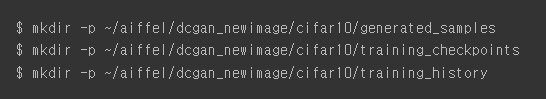

---

# Step 2. 라이브러리 불러오기

In [1]:
import os
import glob
import time

import PIL
import imageio
import numpy as np
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from IPython import display
import matplotlib.pyplot as plt
%matplotlib inline

---

# Step 3. 데이터셋 구성하기

## 3.1 데이터셋 불러오기
* CIFAR-10 데이터셋은 `tf.keras`안에 `datasets`에 포함되어 있다.

In [2]:
cifar10 = tf.keras.datasets.cifar10

(train_x, _), (test_x, _) = cifar10.load_data()   # 라벨이 필요없기에 _(언더스코어)로 데이터를 무시하도록 함

train_x.shape

170508288/170498071 [==============================] - 4s 0us/step


(50000, 32, 32, 3)

* CIFAR-10 데이터셋에 있는 이미지 10개를 출력해보자.

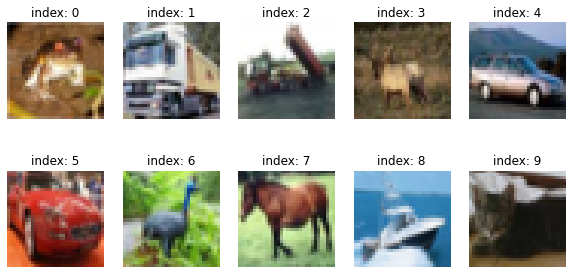

In [3]:
plt.figure(figsize = (10, 5))

for i in range(10):
    plt.subplot(2, 5, i+1)
    plt.imshow(train_x[i])
    plt.title(f'index: {i}')
    plt.axis('off')
    
plt.show()

## 3.2 데이터 전처리

* CIFAR-10 데이터셋은 32 x 32 픽셀의 이미지다.
* 각 픽셀은 0 ~ 255 사이의 정숫값을 가지는 것을 확인할 수 있다.

In [4]:
print("max pixel:", train_x.max())
print("min pixel:", train_x.min())

max pixel: 255
min pixel: 0


### 3.2.1 데이터 정규화
* 각 픽셀을 -1, 1로 정규화를 하여 사용할 예정이다.

In [5]:
train_x = (train_x - 127.5) / 127.5 # 중간값을 0으로 맞춰주기 위해 127.5를 빼고 127.5로 나누어준다.

print("max pixel:", train_x.max())
print("min pixel:", train_x.min())

max pixel: 1.0
min pixel: -1.0


### 3.2.2 학습 데이터 시각화
* 학습할 데이터를 출력해보았다.
* 픽셀을 -1, 1로 정규화를 하였기에 위에서 출력했던 이미지와 다르게 색상이 표현되어 출력되었다.

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


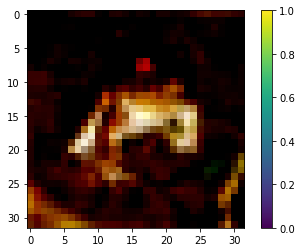

In [6]:
plt.imshow(train_x[0])
plt.colorbar()
plt.show()

* CIFAR-10의 데이터셋에서 인덱스 0  ~ 9까지의 이미지를 시각화해보자.
* 이것 또한 마찬가지로 -1, 1로 정규화를 하였기에 위에서 출력했던 이미지와 다르게 색상이 표현되어 출력되었다.

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

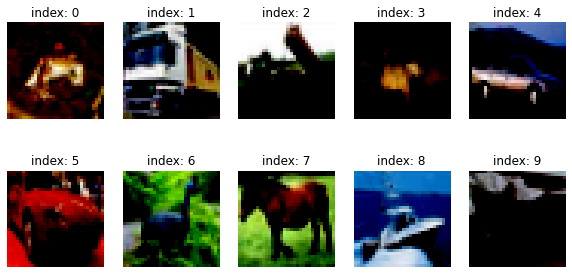

In [7]:
plt.figure(figsize = (10, 5))

for i in range(10):
    plt.subplot(2, 5, i+1)
    plt.imshow(train_x[i])
    plt.title(f'index: {i}')
    plt.axis('off')
    
plt.show()

### 3.2.3 미니배치 데이터셋 구성
* buffer size의 경우, 데이터셋의 크기와 동일하게 또는 그 이상으로 설정해주는 것이 좋다.
* batch size는 너무 크지 않게 256으로 설정하여 진행하였다.

In [8]:
BUFFER_SIZE = 50000
BATCH_SIZE = 256

In [9]:
train_dataset = tf.data.Dataset.from_tensor_slices(train_x).shuffle(BUFFER_SIZE).batch(BATCH_SIZE)
train_dataset

<BatchDataset shapes: (None, 32, 32, 3), types: tf.float64>

---

# Step 4. 생성자 모델 구현하기
* `Conv2DTranspose` 레이어는 일반적인 `Conv2D`와 반대로 이미지 사이즈를 넓혀주는 레이어이다.
* 이 모델에서는 `Conv2DTranspose` 레이어를 사용하여 **(8, 8, 256) → (16, 16, 64) → (32, 32, 3)** 순서로 이미지를 키워나간다.
* `BatchNormalization` 레이어는 신경망의 가중치가 폭발하지 않도록 가중치 값을 정규화시켜준다.
* 중간층들의 활성화 함수는 `LeakyReLU`를 사용하였다.
* -1 ~ 1 이내의 값으로 픽셀 값을 정규화시켰던 데이터셋과 동일하게 하기 위해 마지막 층의 활성화 함수는 `tanh`을 사용하였다.

In [10]:
def make_generator_model():
    
    model = tf.keras.Sequential()
    
    model.add(layers.Dense(8*8*256, use_bias=False, input_shape=(100,)))
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU())
    
    model.add(layers.Reshape((8, 8, 256)))
    
    model.add(layers.Conv2DTranspose(128, kernel_size=(5, 5), strides=(1, 1), padding='same', use_bias=False))
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU())
    
    model.add(layers.Conv2DTranspose(64, kernel_size=(5, 5), strides=(2, 2), padding='same', use_bias=False))
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU())
    
    model.add(layers.Conv2DTranspose(3, kernel_size=(5, 5), strides=(2, 2), padding='same', use_bias=False, activation='tanh'))

    return model

In [11]:
generator = make_generator_model()

generator.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 16384)             1638400   
_________________________________________________________________
batch_normalization (BatchNo (None, 16384)             65536     
_________________________________________________________________
leaky_re_lu (LeakyReLU)      (None, 16384)             0         
_________________________________________________________________
reshape (Reshape)            (None, 8, 8, 256)         0         
_________________________________________________________________
conv2d_transpose (Conv2DTran (None, 8, 8, 128)         819200    
_________________________________________________________________
batch_normalization_1 (Batch (None, 8, 8, 128)         512       
_________________________________________________________________
leaky_re_lu_1 (LeakyReLU)    (None, 8, 8, 128)         0

* generator의 각 layer의 구성을 그림으로 표현해보았다.

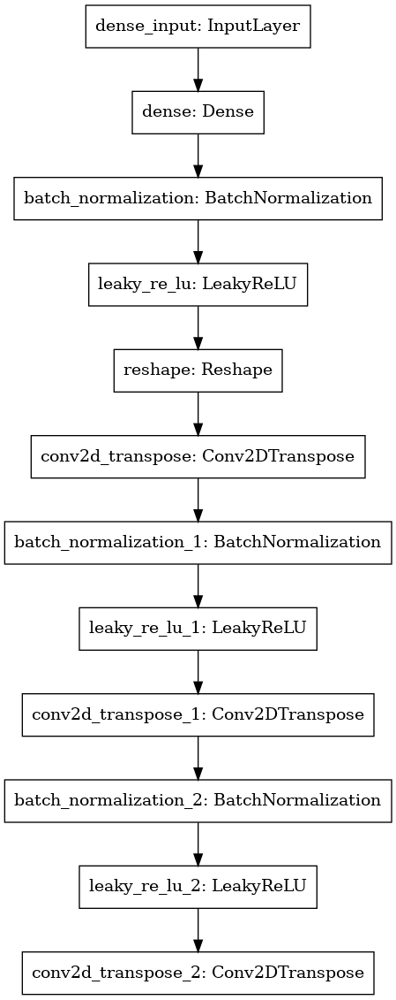

In [12]:
keras.utils.plot_model(generator)

* `tf.random.normal`을 이용하면 가우시안 분포에서 뽑아낸 랜덤 벡터로 이루어진 노이즈 벡터를 만들 수 있다.

In [13]:
noise = tf.random.normal([1, 100])

In [14]:
generated_image = generator(noise, training=False)    # 학습하는 중이 아니니 False로 설정
generated_image.shape

TensorShape([1, 32, 32, 3])

* generator로 만든 이미지를 출력해보았다. 아직 학습을 시키지 않았으니 단순 노이즈가 있는 이미지가 출력되었다.

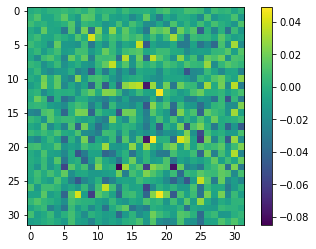

In [15]:
plt.imshow(generated_image[0, :, :, 0])
plt.colorbar()
plt.show()

---

# Step 5. 판별자 모델 구현하기 
*  `Conv2D`층을 사용하여 이미지의 크기를 줄여나간다. (generator과 반대이다.)
* **(32, 32, 3) → (16, 16, 64) → (8, 8, 128)** 까지 줄어든다.
* `Flatten 층`을 사용해서 3차원 이미지를 1차원으로 펴 (1, 8192)형상의 벡터로 변환
* `Dense 층`을 거쳐 단 하나의 값을 출력한다.

In [16]:
def make_discriminator_model():
    
    model = tf.keras.Sequential()
    
    model.add(layers.Conv2D(64, (5, 5), strides=(2, 2), padding='same', input_shape=[32, 32, 3]))
    model.add(layers.LeakyReLU())
    model.add(layers.Dropout(0.3))
    
    model.add(layers.Conv2D(128, (5, 5), strides=(2, 2), padding='same'))
    model.add(layers.LeakyReLU())
    model.add(layers.Dropout(0.3))
    
    model.add(layers.Flatten())
    
    model.add(layers.Dense(1))
    
    return model

In [17]:
discriminator = make_discriminator_model()
discriminator.summary()

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 16, 16, 64)        4864      
_________________________________________________________________
leaky_re_lu_3 (LeakyReLU)    (None, 16, 16, 64)        0         
_________________________________________________________________
dropout (Dropout)            (None, 16, 16, 64)        0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 8, 8, 128)         204928    
_________________________________________________________________
leaky_re_lu_4 (LeakyReLU)    (None, 8, 8, 128)         0         
_________________________________________________________________
dropout_1 (Dropout)          (None, 8, 8, 128)         0         
_________________________________________________________________
flatten (Flatten)            (None, 8192)             

* discriminator의 각 layer의 구성을 그림으로 표현해보았다.

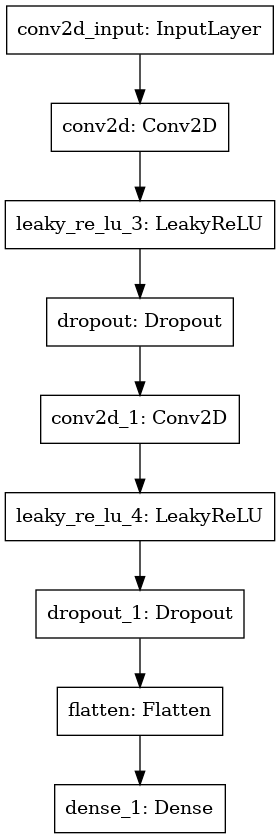

In [18]:
keras.utils.plot_model(discriminator)

* generator로 생성한 랜덤 이미지를 discriminator 모델이 판별한 결과값을 확인해보자.

In [19]:
decision = discriminator(generated_image, training=False)
decision

<tf.Tensor: shape=(1, 1), dtype=float32, numpy=array([[0.00051316]], dtype=float32)>

---

# Step 6. 손실함수와 최적화함수 구현하기

## 6.1 손실함수 구현하기
* `generator loss`와 `discriminator loss`를 구현해보자.
* GAN은 손실함수로 교차 엔트로피(Cross Entropy)를 사용한다.
* `교차 엔트로피(Cross Entropy)`는 점점 가까워지기 원하는 두 값이 얼마나 큰 차이가 나는지를 정량적으로 계산할 때 많이 쓰인다.
* 여기서는 discriminator는 한 개의 이미지가 가짜인지 진짜인지 나타내는 2개의 클래스 간 분류 문제를 풀어야 하므로 `교차 엔트로피(Cross Entropy)`를 사용한다.  
    
    
- `fake_output` : 생성자가 생성한 Fake Image를 구분자에 입력시켜서 판별된 값  
- `real_output` : 기존에 있던 Real Image를 구분자에 입력시켜서 판별된 값  
- `fake_output`과 `real_output`을 각각 1 또는 0에 비교해야 한다.
- `tf.ones_like()` 함수를 사용하면 특정 벡터와 동일한 크기이면서 값은 1로 가득 채워진 벡터를 만들어준다.
- `tf.zeros_like()` 함수를 사용하면 특정 벡터와 동일한 크기이면서 값은 0으로 가득 채워진 벡터를 만들어준다.

In [20]:
cross_entropy = tf.keras.losses.BinaryCrossentropy(from_logits = True)

* `generator loss`는 `fake_output`이 **1**에 가까워지길 바라기에 아래와 같이 교차 엔트로피 값을 계산하면 됨

In [21]:
# generator loss

def generator_loss(fake_output):
    return cross_entropy(tf.ones_like(fake_output), fake_output)

* `discriminator loss`는 `real_output`은 **1**에, `fake_output`은 **0**에 가까워지길 바라기에 아래와 같이 교차 엔트로피 값을 계산하면 됨

In [22]:
# discriminator loss

def discriminator_loss(real_output, fake_output):
    real_loss = cross_entropy(tf.ones_like(real_output), real_output)
    fake_loss = cross_entropy(tf.zeros_like(fake_output), fake_output)
    total_loss = real_loss + fake_loss
    return total_loss

* discriminator의 출력값을 가지고 실제/생성 이미지 판별 정확도(accuracy)를 구현해보자.
* `real accuracy`와 f`ake accuracy`는 초반에는 1.0에 가깝게 나오다가, **서서히 낮아져서 둘 다 0.5에 가까워지는 것이 이상적이다.**

In [23]:
# discriminator accuracy

def discriminator_accuracy(real_output, fake_output):
    real_accuracy = tf.reduce_mean(tf.cast(tf.math.greater_equal(real_output, tf.constant([0.5])), tf.float32))
    fake_accuracy = tf.reduce_mean(tf.cast(tf.math.less(fake_output, tf.constant([0.5])), tf.float32))
    return real_accuracy, fake_accuracy

## 6.2 최적화함수 구현하기
* generator와 discriminator를 최적화하는 optimizer를 정의해보자.
* generator와 discriminator는 따로 학습을 진행하는 개별 네트워크이기에 optimizer를 따로 만들어줘야 한다.

In [24]:
generator_optimizer = tf.keras.optimizers.Adam(1e-4)
discriminator_optimizer = tf.keras.optimizers.Adam(1e-4)

* 학습이 어덯게 진행되어가고 있는지 확인하기 위해 generator가 생성한 샘플을 확인해보자.
* 샘플은 한 번에 16장을 생성할 것이다.
* 매번 같은 노이즈로 생성해야 그에 대한 진전 과정을 확인할 수 있으니 고정된 seed 노이즈를 만들어 주어야 한다.
* 100차원의 노이즈를 총 16개, `(16, 100)` 형상의 벡터를 만들어두자.

In [25]:
noise_dim = 100
num_examples_to_generator = 16

seed = tf.random.normal([num_examples_to_generator, noise_dim])
seed.shape

TensorShape([16, 100])

---

# Step 7. 훈련과정 상세 기능 구현하기

* 하나의 미니배치당 훈련 과정을 처리하는 train_step()함수를 구현해보자.
* 학습시킬 훈련 함수 위에 `@tf.function`이라는 데코레이터를 붙여서 사용한다.
* 데코레이터는 우리가 직접 session을 열어서 학습했다가, 학습이 완료되면 다시 닫아주는 등의 번거로운 과정을 내부적으로 처리해서 더욱 편리하게 학습시킬 수 있게 해준다

In [26]:
@tf.function
def train_step(images):  #(1) 입력데이터
    noise = tf.random.normal([BATCH_SIZE, noise_dim])  #(2) 생성자 입력 노이즈

    with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:  #(3) tf.GradientTape() 오픈
        generated_images = generator(noise, training=True)  #(4) generated_images 생성

        #(5) discriminator 판별
        real_output = discriminator(images, training=True)
        fake_output = discriminator(generated_images, training=True)

        #(6) loss 계산
        gen_loss = generator_loss(fake_output)
        disc_loss = discriminator_loss(real_output, fake_output)

        #(7) accuracy 계산
        real_accuracy, fake_accuracy = discriminator_accuracy(real_output, fake_output) 
    
    #(8) gradient 계산
    gradients_of_generator = gen_tape.gradient(gen_loss, generator.trainable_variables)
    gradients_of_discriminator = disc_tape.gradient(disc_loss, discriminator.trainable_variables)

    #(9) 모델 학습
    generator_optimizer.apply_gradients(zip(gradients_of_generator, generator.trainable_variables))
    discriminator_optimizer.apply_gradients(zip(gradients_of_discriminator, discriminator.trainable_variables))

    return gen_loss, disc_loss, real_accuracy, fake_accuracy  #(10) 리턴값

*  16개의 고정된 seed를 입력으로 하여 훈련 과정 동안 생성한 이미지를 시각화하는 `generate_and_save_images()` 함수를 구현해보자.

In [27]:
def generate_and_save_images(model, epoch, it, sample_seeds):
    
    predictions = model(sample_seeds, training = False)
    
    fig = plt.figure(figsize=(4, 4))
    
    for i in range(predictions.shape[0]):
        plt.subplot(4, 4, i+1)
        plt.imshow(np.array(predictions[i]*127.5 + 127.5).astype('uint8'))
        plt.axis('off')
        
    plt.savefig('{}/aiffel/dcgan_newimage/cifar10/generated_samples/sample_epoch_{:04d}_iter_{:03d}.png'
                    .format(os.getenv('HOME'), epoch, it))
    
    plt.show()

* 훈련 epoch마다 generator loss, discriminator loss, discriminator fake_accuracy, real_accuracy 히스토리(history)를 그래프로 시각화하는 `draw_train_history()` 함수를 구현해보자.

In [28]:
from matplotlib.pylab import rcParams
rcParams['figure.figsize'] = 15, 6

def draw_train_history(history, epoch):
    # summarize history for loss  
    plt.subplot(2, 1, 1)  
    plt.plot(history['gen_loss'])  
    plt.plot(history['disc_loss'])  
    plt.title('model loss')  
    plt.ylabel('loss')  
    plt.xlabel('batch iters')  
    plt.legend(['gen_loss', 'disc_loss'], loc='upper left')  

    # summarize history for accuracy  
    plt.subplot(2, 1, 2)  
    plt.plot(history['fake_accuracy'])  
    plt.plot(history['real_accuracy'])  
    plt.title('discriminator accuracy')  
    plt.ylabel('accuracy')  
    plt.xlabel('batch iters')  
    plt.legend(['fake_accuracy', 'real_accuracy'], loc='upper left')  
    
    # training_history 디렉토리에 epoch별로 그래프를 이미지 파일로 저장합니다.
    plt.savefig('{}/aiffel/dcgan_newimage/cifar10/training_history/train_history_{:04d}.png'
                    .format(os.getenv('HOME'), epoch))
    plt.show()

*  training_checkpoints 디렉토리에 몇 epoch마다 모델을 저장하는 checkpoint 모듈을 설정해보자.
* `tf.train.Checkpoint`를 활용하면 매번 모델을 직접 저장해 주지 않아도, 코드 한 줄로 빠르고 편하게 버전 관리를 할 수 있다.

In [29]:
checkpoint_dir = os.getenv('HOME')+'/aiffel/dcgan_newimage/cifar10/training_checkpoints'

checkpoint_prefix = os.path.join(checkpoint_dir, "ckpt")
checkpoint = tf.train.Checkpoint(generator_optimizer=generator_optimizer,
                                 discriminator_optimizer=discriminator_optimizer,
                                 generator=generator,
                                 discriminator=discriminator)

---

# Step 8. 학습 과정 진행하기

* Step 7에서 구현한 함수들을 활용하여 모델 학습을 진행해보자.

In [30]:
def train(dataset, epochs, save_every):
    start = time.time()
    history = {'gen_loss':[], 'disc_loss':[], 'real_accuracy':[], 'fake_accuracy':[]}

    for epoch in range(epochs):
        epoch_start = time.time()
        for it, image_batch in enumerate(dataset):
            gen_loss, disc_loss, real_accuracy, fake_accuracy = train_step(image_batch)
            history['gen_loss'].append(gen_loss)
            history['disc_loss'].append(disc_loss)
            history['real_accuracy'].append(real_accuracy)
            history['fake_accuracy'].append(fake_accuracy)

            if it % 50 == 0:
                display.clear_output(wait=True)
                generate_and_save_images(generator, epoch+1, it+1, seed)
                print('Epoch {} | iter {}'.format(epoch+1, it+1))
                print('Time for epoch {} : {} sec'.format(epoch+1, int(time.time()-epoch_start)))

        if (epoch + 1) % save_every == 0:
            checkpoint.save(file_prefix=checkpoint_prefix)

        display.clear_output(wait=True)
        generate_and_save_images(generator, epochs, it, seed)
        print('Time for training : {} sec'.format(int(time.time()-start)))

        draw_train_history(history, epoch)

* 모델이 학습해 나가면서 만들어내는 결과물을 실시간으로 확인할 수 있다.
* epoch는 250으로 설정하였다.

In [33]:
save_every = 5
EPOCHS = 250

# 사용가능한 GPU 디바이스 확인
tf.config.list_physical_devices("GPU")

[PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]

* 학습이 완료되었으며, generator가 생성한 이미지와 loss, accuracy의 그래프가 출력되었다.
* 사진은 육안으로만 봐도 객체가 명확하게 보이지 않는 이미지가 생성된 것을 알 수 있다.
* loss 값도 높으며, fake & real accuracy 모두 0.5가 아닌 1에 가까이 계속 유지되고 있었다.  
    → generator가 만든 이미지가 아직 discriminator를 성공적으로 속이지 못하고 있다.

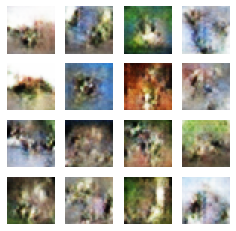

Time for training : 3854 sec


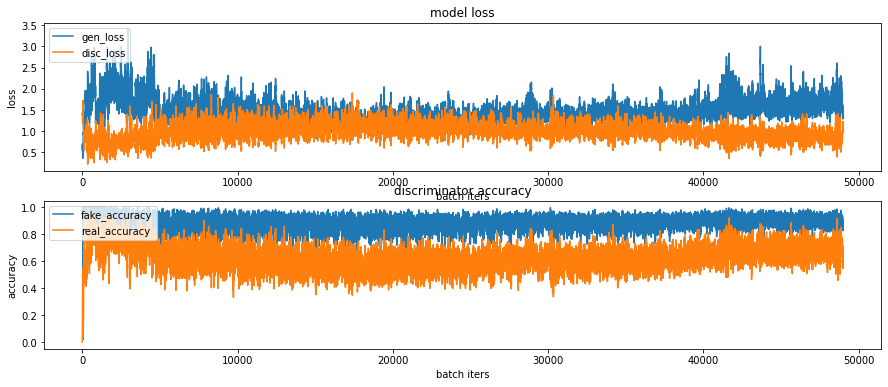

CPU times: user 1h 5min 57s, sys: 6min 32s, total: 1h 12min 29s
Wall time: 1h 4min 17s


In [34]:
%%time
train(train_dataset, EPOCHS, save_every)

In [35]:
anim_file = os.getenv('HOME')+'/aiffel/dcgan_newimage/cifar10/cifar10_dcgan.gif'

with imageio.get_writer(anim_file, mode='I') as writer:
    filenames = glob.glob('{}/aiffel/dcgan_newimage/cifar10/generated_samples/sample*.png'.format(os.getenv('HOME')))
    filenames = sorted(filenames)
    last = -1
    for i, filename in enumerate(filenames):
        frame = 2*(i**0.5)
        if round(frame) > round(last):
            last = frame
        else:
            continue
        image = imageio.imread(filename)
        writer.append_data(image)
    image = imageio.imread(filename)
    writer.append_data(image)

!ls -l ~/aiffel/dcgan_newimage/cifar10/cifar10_dcgan.gif

-rw-r--r-- 1 root root 2264402 Feb 14 00:02 /aiffel/aiffel/dcgan_newimage/cifar10/cifar10_dcgan.gif


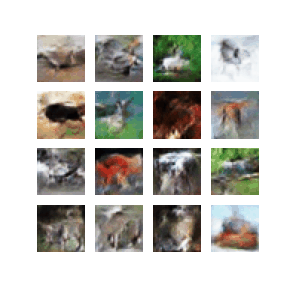  
* gif인데,,, gif로 저장이 되지 않았다...ㅠㅠ

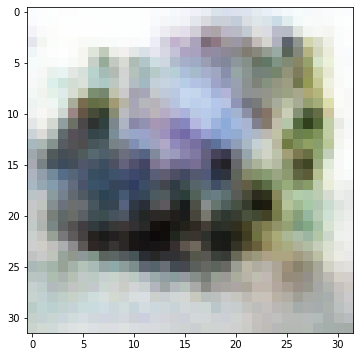

In [36]:
checkpoint_dir = os.getenv('HOME')+'/aiffel/dcgan_newimage/cifar10/training_checkpoints'

latest = tf.train.latest_checkpoint(checkpoint_dir)
checkpoint.restore(latest)

generator = checkpoint.generator
discriminator = checkpoint.discriminator

# 로드한 모델이 정상적으로 이미지를 생성하는지 확인해 봅니다. 
noise = tf.random.normal([1, 100])
generated_image = generator(noise, training=False)

np_generated = generated_image.numpy()
np_generated = (np_generated * 127.5) + 127.5   # reverse of normalization
np_generated = np_generated.astype(int)
plt.imshow(np_generated[0])
plt.show()  # 정상적으로 모델이 로드되었다면 랜덤 이미지가 아니라 CIFAR-10 이미지가 그려질 것입니다.

---

# Step 9. 개선하기

## 9.1 1번째 개선
* generator 모델엔 ReLU를 사용, discriminator 모델에는 Leaky ReLU를 사용하였다.
* Adam에는 learning rate = 0.0002, momentum(beta1) = 0.5로 두었다  
    
    
* [참고한 Reference](https://machinelearningmastery.com/how-to-train-stable-generative-adversarial-networks/)
* ReLU is recommended for the generator, but not for the discriminator model. Instead, a variation of ReLU that allows values less than zero, called Leaky ReLU, is preferred in the discriminator.
* Specifically, the Adam version of stochastic gradient descent was used to train the models with a learning rate of 0.0002 and a momentum (beta1) of 0.5.

In [11]:
def make_generator_model():
    
    model = tf.keras.Sequential()
    
    model.add(layers.Dense(8*8*256, use_bias=False, input_shape=(100,)))
    model.add(layers.BatchNormalization())
    model.add(layers.ReLU())
    
    model.add(layers.Reshape((8, 8, 256)))
    
    model.add(layers.Conv2DTranspose(128, kernel_size=(5, 5), strides=(1, 1), padding='same', use_bias=False))
    model.add(layers.BatchNormalization())
    model.add(layers.ReLU())
    
    model.add(layers.Conv2DTranspose(64, kernel_size=(5, 5), strides=(2, 2), padding='same', use_bias=False))
    model.add(layers.BatchNormalization())
    model.add(layers.ReLU())
    
    model.add(layers.Conv2DTranspose(3, kernel_size=(5, 5), strides=(2, 2), padding='same', use_bias=False, activation='tanh'))

    return model

In [12]:
generator = make_generator_model()

generator.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 16384)             1638400   
_________________________________________________________________
batch_normalization (BatchNo (None, 16384)             65536     
_________________________________________________________________
re_lu (ReLU)                 (None, 16384)             0         
_________________________________________________________________
reshape (Reshape)            (None, 8, 8, 256)         0         
_________________________________________________________________
conv2d_transpose (Conv2DTran (None, 8, 8, 128)         819200    
_________________________________________________________________
batch_normalization_1 (Batch (None, 8, 8, 128)         512       
_________________________________________________________________
re_lu_1 (ReLU)               (None, 8, 8, 128)         0

In [20]:
def make_discriminator_model():
    
    model = tf.keras.Sequential()
    
    model.add(layers.Conv2D(64, (5, 5), strides=(2, 2), padding='same', input_shape=[32, 32, 3]))
    model.add(layers.LeakyReLU(alpha = 0.2))
    model.add(layers.Dropout(0.3))
    
    model.add(layers.Conv2D(128, (5, 5), strides=(2, 2), padding='same'))
    model.add(layers.LeakyReLU(alpha = 0.2))
    model.add(layers.Dropout(0.3))
    
    model.add(layers.Flatten())
    
    model.add(layers.Dense(1))
    
    return model

In [22]:
discriminator = make_discriminator_model()
discriminator.summary()

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 16, 16, 64)        4864      
_________________________________________________________________
leaky_re_lu (LeakyReLU)      (None, 16, 16, 64)        0         
_________________________________________________________________
dropout (Dropout)            (None, 16, 16, 64)        0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 8, 8, 128)         204928    
_________________________________________________________________
leaky_re_lu_1 (LeakyReLU)    (None, 8, 8, 128)         0         
_________________________________________________________________
dropout_1 (Dropout)          (None, 8, 8, 128)         0         
_________________________________________________________________
flatten (Flatten)            (None, 8192)             

In [28]:
generator_optimizer = tf.keras.optimizers.Adam(learning_rate=0.0002, beta_1=0.5, epsilon=1e-4)
discriminator_optimizer = tf.keras.optimizers.Adam(learning_rate=0.0002, beta_1=0.5, epsilon=1e-4)

In [35]:
save_every = 5
EPOCHS = 250

* `discriminator loss`가 높게 나왔고, `real accuracy`가 낮게 나왔다.  
    → discriminator가 실제 이미지를 판별하지 못하였다.
* `discriminator`의 성능이 좋지 않다는 것으로 판단이 되는데, 보완이 필요한 것 같다.
* 그렇다고 `generator`의 성능이 좋다고는 할 수 없는 것 같다....

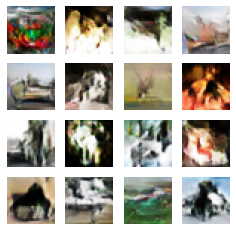

Time for training : 3740 sec


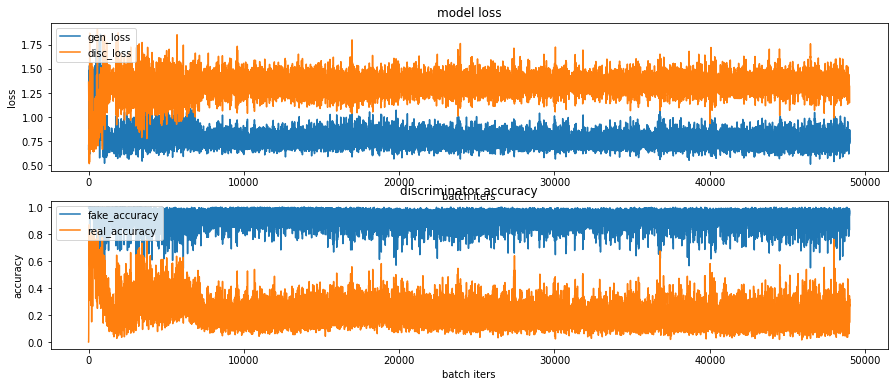

CPU times: user 1h 4min 2s, sys: 6min 28s, total: 1h 10min 31s
Wall time: 1h 2min 23s


In [36]:
%%time
train(train_dataset, EPOCHS, save_every)

In [37]:
anim_file = os.getenv('HOME')+'/aiffel/dcgan_newimage/cifar10/cifar10_dcgan_2.gif'

with imageio.get_writer(anim_file, mode='I') as writer:
    filenames = glob.glob('{}/aiffel/dcgan_newimage/cifar10/generated_samples/sample*.png'.format(os.getenv('HOME')))
    filenames = sorted(filenames)
    last = -1
    for i, filename in enumerate(filenames):
        frame = 2*(i**0.5)
        if round(frame) > round(last):
            last = frame
        else:
            continue
        image = imageio.imread(filename)
        writer.append_data(image)
    image = imageio.imread(filename)
    writer.append_data(image)

!ls -l ~/aiffel/dcgan_newimage/cifar10/cifar10_dcgan_2.gif

-rw-r--r-- 1 root root 2216292 Feb 14 03:05 /aiffel/aiffel/dcgan_newimage/cifar10/cifar10_dcgan_2.gif


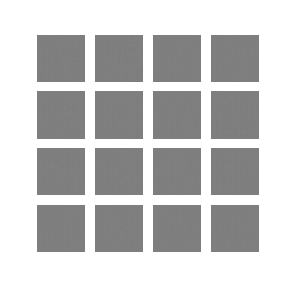  

---

## 9.2 2번째 개선
* generator 모델엔 ReLU를 사용, discriminator 모델에는 Leaky ReLU를 사용하였다. (1번째 개선과 동일하게 진행)
* Adam에는 learning rate = 0.0002, momentum(beta1) = 0.5로 두었다. (1번째 개선과 동일하게 진행)  
    
    
* generator에는 optimizer로 Adam을 사용, discriminator에는 optimizer로 SGD를 사용하였다.
    
    
* [참고한 Reference](https://github.com/soumith/ganhacks)
* Use SGD for discriminator and ADAM for generator

In [39]:
def make_generator_model():
    
    model = tf.keras.Sequential()
    
    model.add(layers.Dense(8*8*256, use_bias=False, input_shape=(100,)))
    model.add(layers.BatchNormalization())
    model.add(layers.ReLU())
    
    model.add(layers.Reshape((8, 8, 256)))
    
    model.add(layers.Conv2DTranspose(128, kernel_size=(5, 5), strides=(1, 1), padding='same', use_bias=False))
    model.add(layers.BatchNormalization())
    model.add(layers.ReLU())
    
    model.add(layers.Conv2DTranspose(64, kernel_size=(5, 5), strides=(2, 2), padding='same', use_bias=False))
    model.add(layers.BatchNormalization())
    model.add(layers.ReLU())
    
    model.add(layers.Conv2DTranspose(3, kernel_size=(5, 5), strides=(2, 2), padding='same', use_bias=False, activation='tanh'))

    return model

In [40]:
generator = make_generator_model()

generator.summary()

Model: "sequential_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_2 (Dense)              (None, 16384)             1638400   
_________________________________________________________________
batch_normalization_3 (Batch (None, 16384)             65536     
_________________________________________________________________
re_lu_3 (ReLU)               (None, 16384)             0         
_________________________________________________________________
reshape_1 (Reshape)          (None, 8, 8, 256)         0         
_________________________________________________________________
conv2d_transpose_3 (Conv2DTr (None, 8, 8, 128)         819200    
_________________________________________________________________
batch_normalization_4 (Batch (None, 8, 8, 128)         512       
_________________________________________________________________
re_lu_4 (ReLU)               (None, 8, 8, 128)        

In [44]:
def make_discriminator_model():
    
    model = tf.keras.Sequential()
    
    model.add(layers.Conv2D(64, (5, 5), strides=(1, 1), padding='same', input_shape=[32, 32, 3]))
    model.add(layers.LeakyReLU(alpha = 0.2))
    model.add(layers.Dropout(0.3))
    
    model.add(layers.Conv2D(128, (5, 5), strides=(2, 2), padding='same'))
    model.add(layers.LeakyReLU(alpha = 0.2))
    model.add(layers.Dropout(0.3))
    
    model.add(layers.Conv2D(128, (5, 5), strides=(2, 2), padding='same'))
    model.add(layers.LeakyReLU(alpha = 0.2))
    model.add(layers.Dropout(0.3))
    
    model.add(layers.Flatten())
    
    model.add(layers.Dense(1))
    
    return model

In [45]:
discriminator = make_discriminator_model()
discriminator.summary()

Model: "sequential_3"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_2 (Conv2D)            (None, 32, 32, 64)        4864      
_________________________________________________________________
leaky_re_lu_2 (LeakyReLU)    (None, 32, 32, 64)        0         
_________________________________________________________________
dropout_2 (Dropout)          (None, 32, 32, 64)        0         
_________________________________________________________________
conv2d_3 (Conv2D)            (None, 16, 16, 128)       204928    
_________________________________________________________________
leaky_re_lu_3 (LeakyReLU)    (None, 16, 16, 128)       0         
_________________________________________________________________
dropout_3 (Dropout)          (None, 16, 16, 128)       0         
_________________________________________________________________
conv2d_4 (Conv2D)            (None, 8, 8, 128)        

In [51]:
generator_optimizer = tf.keras.optimizers.Adam(learning_rate=0.0002, beta_1=0.5, epsilon=1e-4)
discriminator_optimizer = tf.keras.optimizers.SGD(learning_rate=0.01, momentum=0.0, nesterov=False)

In [58]:
save_every = 5
EPOCHS = 250

* loss 값들이 모두 0에 가까워진 것을 확인할 수 있다. 확실히 이전 시도에 비해 loss 값이 좋아졌다.
* real accuracy가 낮기도 했지만 뒷부분에서는 높아졌다.
* fake accuracy는 real accuracy에 가려지긴 했는데 여전히 1에 가까운 것을 알 수 있다.

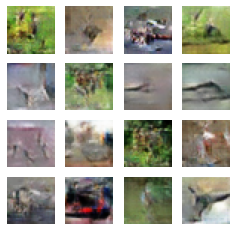

Time for training : 9350 sec


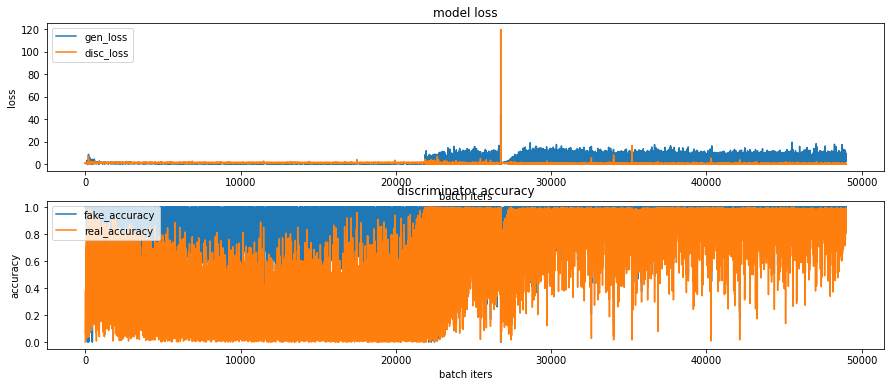

CPU times: user 2h 37min 6s, sys: 6min 35s, total: 2h 43min 42s
Wall time: 2h 35min 53s


In [59]:
%%time
train(train_dataset, EPOCHS, save_every)

In [60]:
anim_file = os.getenv('HOME')+'/aiffel/dcgan_newimage/cifar10/cifar10_dcgan_3.gif'

with imageio.get_writer(anim_file, mode='I') as writer:
    filenames = glob.glob('{}/aiffel/dcgan_newimage/cifar10/generated_samples/sample*.png'.format(os.getenv('HOME')))
    filenames = sorted(filenames)
    last = -1
    for i, filename in enumerate(filenames):
        frame = 2*(i**0.5)
        if round(frame) > round(last):
            last = frame
        else:
            continue
        image = imageio.imread(filename)
        writer.append_data(image)
    image = imageio.imread(filename)
    writer.append_data(image)

!ls -l ~/aiffel/dcgan_newimage/cifar10/cifar10_dcgan_3.gif

-rw-r--r-- 1 root root 2143657 Feb 14 06:10 /aiffel/aiffel/dcgan_newimage/cifar10/cifar10_dcgan_3.gif


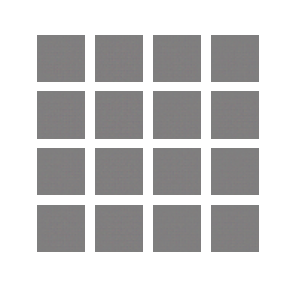  
* 이번 시도도 객체가 조금씩 선명해진 것을 확인할 수 있다.

---

## 9.3 3번째 개선
* generator 모델엔 ReLU를 사용, discriminator 모델에는 Leaky ReLU를 사용하였다. (1번째 개선과 동일하게 진행)
* Adam에는 learning rate = 0.0002, momentum(beta1) = 0.5로 두었다. (1번째 개선과 동일하게 진행)  
    
    
* generator에는 optimizer로 Adam을 사용, discriminator에는 optimizer로 SGD를 사용하였다. (2번째 개선과 동일하게 진행)  
    
    
* generator에 dropoutlayer를 추가해보았다.  
* 그리고 epoch를 500으로 늘려서 학습시켰다. 
    
    
* [참고한 Reference](https://github.com/soumith/ganhacks)
* Use Dropouts in G in both train and test phase

In [31]:
def make_generator_model():
    
    model = tf.keras.Sequential()
    
    model.add(layers.Dense(8*8*256, use_bias=False, input_shape=(100,)))
    model.add(layers.BatchNormalization())
    model.add(layers.ReLU())
    model.add(layers.Dropout(0.3))
    
    model.add(layers.Reshape((8, 8, 256)))
    
    model.add(layers.Conv2DTranspose(128, kernel_size=(5, 5), strides=(1, 1), padding='same', use_bias=False))
    model.add(layers.BatchNormalization())
    model.add(layers.ReLU())
    model.add(layers.Dropout(0.3))
    
    model.add(layers.Conv2DTranspose(64, kernel_size=(5, 5), strides=(2, 2), padding='same', use_bias=False))
    model.add(layers.BatchNormalization())
    model.add(layers.ReLU())
    model.add(layers.Dropout(0.3))
    
    model.add(layers.Conv2DTranspose(3, kernel_size=(5, 5), strides=(2, 2), padding='same', use_bias=False, activation='tanh'))

    return model

In [32]:
generator = make_generator_model()

generator.summary()

Model: "sequential_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_2 (Dense)              (None, 16384)             1638400   
_________________________________________________________________
batch_normalization_3 (Batch (None, 16384)             65536     
_________________________________________________________________
re_lu (ReLU)                 (None, 16384)             0         
_________________________________________________________________
dropout_2 (Dropout)          (None, 16384)             0         
_________________________________________________________________
reshape_1 (Reshape)          (None, 8, 8, 256)         0         
_________________________________________________________________
conv2d_transpose_3 (Conv2DTr (None, 8, 8, 128)         819200    
_________________________________________________________________
batch_normalization_4 (Batch (None, 8, 8, 128)        

In [33]:
def make_discriminator_model():
    
    model = tf.keras.Sequential()
    
    model.add(layers.Conv2D(64, (5, 5), strides=(1, 1), padding='same', input_shape=[32, 32, 3]))
    model.add(layers.LeakyReLU(alpha = 0.2))
    model.add(layers.Dropout(0.3))
    
    model.add(layers.Conv2D(128, (5, 5), strides=(2, 2), padding='same'))
    model.add(layers.LeakyReLU(alpha = 0.2))
    model.add(layers.Dropout(0.3))
    
    model.add(layers.Conv2D(128, (5, 5), strides=(2, 2), padding='same'))
    model.add(layers.LeakyReLU(alpha = 0.2))
    model.add(layers.Dropout(0.3))
    
    model.add(layers.Flatten())
    
    model.add(layers.Dense(1))
    
    return model

In [34]:
discriminator = make_discriminator_model()
discriminator.summary()

Model: "sequential_3"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_2 (Conv2D)            (None, 32, 32, 64)        4864      
_________________________________________________________________
leaky_re_lu_5 (LeakyReLU)    (None, 32, 32, 64)        0         
_________________________________________________________________
dropout_5 (Dropout)          (None, 32, 32, 64)        0         
_________________________________________________________________
conv2d_3 (Conv2D)            (None, 16, 16, 128)       204928    
_________________________________________________________________
leaky_re_lu_6 (LeakyReLU)    (None, 16, 16, 128)       0         
_________________________________________________________________
dropout_6 (Dropout)          (None, 16, 16, 128)       0         
_________________________________________________________________
conv2d_4 (Conv2D)            (None, 8, 8, 128)        

In [35]:
generator_optimizer = tf.keras.optimizers.Adam(learning_rate=0.0002, beta_1=0.5, epsilon=1e-4)
discriminator_optimizer = tf.keras.optimizers.SGD(learning_rate=0.01, momentum=0.0, nesterov=False)

In [36]:
save_every = 5
EPOCHS = 500

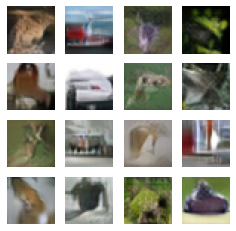

Time for training : 21127 sec


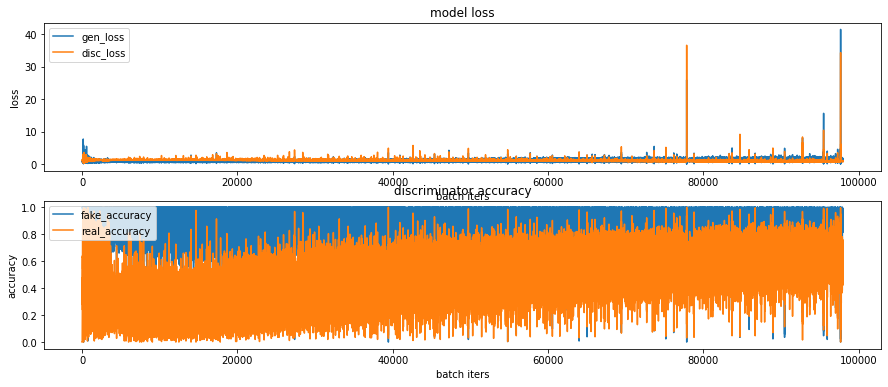

CPU times: user 5h 53min 23s, sys: 13min 22s, total: 6h 6min 46s
Wall time: 5h 52min 13s


In [37]:
%%time
train(train_dataset, EPOCHS, save_every)

In [38]:
anim_file = os.getenv('HOME')+'/aiffel/dcgan_newimage/cifar10/cifar10_dcgan_4.gif'

with imageio.get_writer(anim_file, mode='I') as writer:
    filenames = glob.glob('{}/aiffel/dcgan_newimage/cifar10/generated_samples/sample*.png'.format(os.getenv('HOME')))
    filenames = sorted(filenames)
    last = -1
    for i, filename in enumerate(filenames):
        frame = 2*(i**0.5)
        if round(frame) > round(last):
            last = frame
        else:
            continue
        image = imageio.imread(filename)
        writer.append_data(image)
    image = imageio.imread(filename)
    writer.append_data(image)

!ls -l ~/aiffel/dcgan_newimage/cifar10/cifar10_dcgan_4.gif

-rw-r--r-- 1 root root 2748239 Feb 15 02:59 /aiffel/aiffel/dcgan_newimage/cifar10/cifar10_dcgan_4.gif


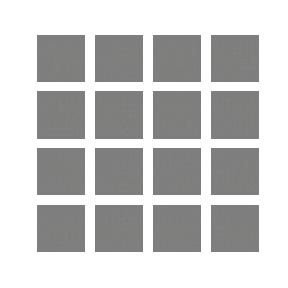
* 에포크를 기존보다 오래 돌리다보니 확실히 뒷부분에서 이미지가 선명해지는 것을 볼 수 있었다.

---

# 🌞 회고

# 1) 어려웠던 점
* 처음에 이미지를 생성해내었을 때, 현재와 같은 색상이 아니라 다른 색상들로 나와서 찾아보다가 선배 기수분들의 코드에서 정답을 찾을 수 있었다.
* 다양한 방법을 시도하였지만accuracy, 특히 fake accuracy가 1에서 아래로 잘 떨어지지 않았다.
* 아직 정확히 GAN에 대해 알지 못해서인지 현재 적용한 방법 이외의 것들을 적용하지 못하였다.

# 2) 개선 시도
* LMS와 동일하게 진행하였을 때와, 첫 개선을 하였을 때를 비교해보면 크게 달라진 것은 없었다. 이미지는 약간 선명해진 것 같으나 loss 값은 여전히 높았다.
* 그래서 두번째 개선을 하였을 때는 LMS, 첫번째 개선에 비해 loss 값이 낮아진 것을 확인할 수 있었다.
* 두번째 개선에서는 discriminator의 optimizer로 SGD로만 변경해서 진행하였는데, 이것이 영향을 미쳤나보다.
* 마지막 세번째 개선에는 generator에 dropout layer를 추가하고 에포크도 올려서 진행을 하였는데, 에포크때문인지 이미지가 확실히 선명해졌다.
* 하지만 여전히 fake accuracy는 1 밑으로 내려가지 않았다...이 부분을 해결하는 방법이 너무나 궁금하다..!

# 3) 프로젝트 후기
* LMS에서 제공한 다양한 참고자료를 보며 모델의 성능을 개선하려고 노력하였다. 여러 방법들이 많이 제시되었지만, 내가 할 수 있는 부분들을 선택하여 진행하였다. 
* 어떻게 하면 성능을 개선하는 방법을 적용할까하며 찾아보며 직접 적용한 것을 통해 많이 배울 수 있었다.
* 그리고 혼공머 풀잎스쿨 시간에서 배운 layer 구성을 그림으로 표현한 것을 해보았다.